<a href="https://colab.research.google.com/github/Machine-Learning-Visao-Computacional-T1/CodigosDeAula-Python-Dados-/blob/main/Semana2/Exemplo_Detec%C3%A7%C3%A3o_de_Rosto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

--2026-04-22 01:03:37--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.02s   

2026-04-22 01:03:37 (45.0 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]

--2026-04-22 01:03:37--  https://upload.wikimedia.org/wikipedia/commons/3/37/Dagestani_man_and_woman.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 185.15.59.240, 2a02:ec80:300:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|185.15.59.240|:443... connected.
HTTP request sent, awaiting response... 2

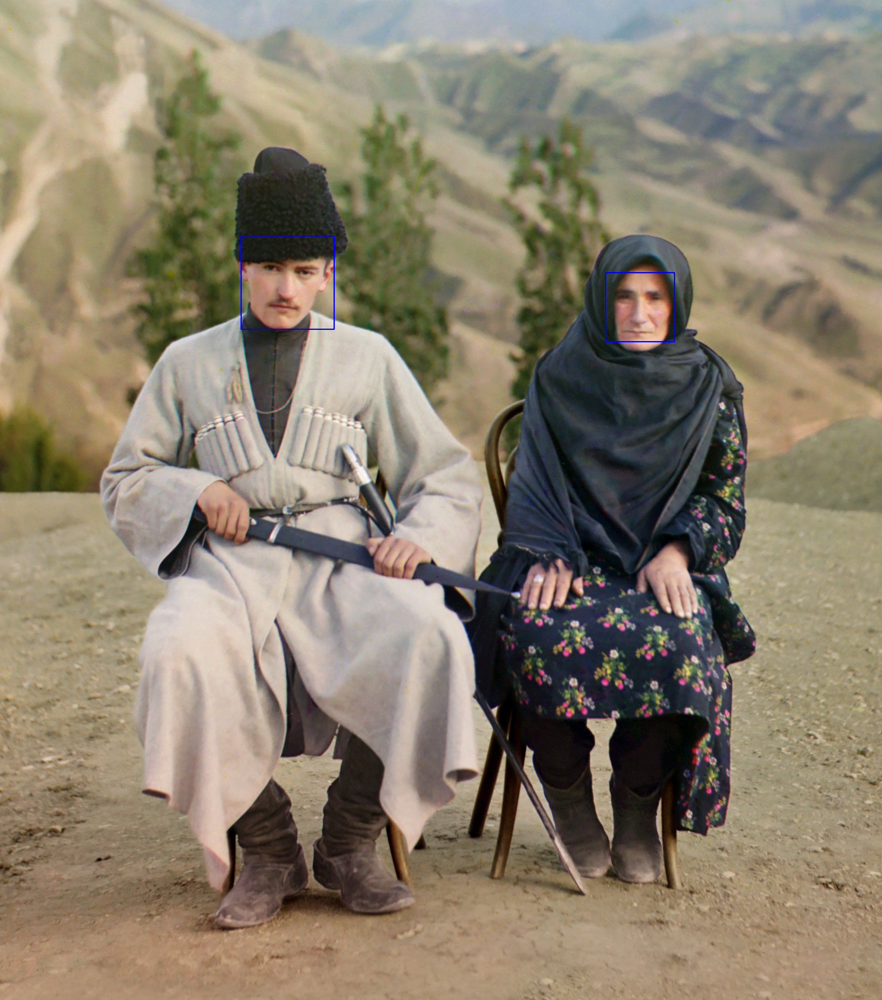

In [ ]:
import cv2  # OpenCV
from google.colab.patches import cv2_imshow

# 1. Baixar o classificador Haar Cascade corretamente
!wget -O haarcascade_frontalface_default.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml

# 2. Carregar o classificador
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

# Verificação importante
if face_cascade.empty():
    raise IOError("Erro ao carregar o classificador Haar Cascade")

# 3. Baixar uma imagem REAL (não HTML)
!wget -O foto.jpg https://upload.wikimedia.org/wikipedia/commons/3/37/Dagestani_man_and_woman.jpg

# Se quiser usar sua própria imagem:
# from google.colab import files
# uploaded = files.upload()

# 4. Ler a imagem
img = cv2.imread('foto.jpg')

# Verificação importante
if img is None:
    raise IOError("Erro ao carregar a imagem")

# 5. Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 6. Detectar rostos
faces = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=7,
    # minNeighbors estava em 5, e detectou 6 rostos.
    # Então aumentei para 7. Aumentar esse valor reduz falsos positivos!
    # Em 7, foram encontrados 4 rostos.
    minSize=(70, 70)
)

# CURIOSIDADES:
# Limitação do Haar Cascade:
# Esse método é:
# antigo (pré-deep learning)
# rápido, mas impreciso
# 👉 hoje ele é mais usado para aprendizado, não produção

# Alternativa moderna (muito melhor):
# Se quiser resultados realmente bons:
# usar DNN do OpenCV
# ou biblioteca como face_recognition
# Eles usam redes neurais → muito mais precisos

# 6a. Quantidade de Rostos Encontrados:
print(f"Quantidade de Rostos Encontrados: {len(faces)}")

# FILTRAR DETECÇÕES MUITO PEQUENAS:
# faces = [f for f in faces if f[2] > 50 and f[3] > 50]

# ROSTOS FALSOS:
# Por que isso acontece?
# O classificador Haar Cascade funciona com padrões simples de contraste (tipo olhos escuros + região clara + bordas).
# Ele não entende rostos de verdade, só padrões parecidos.
# Então ele pode confundir coisas como:
#     sombras
#     partes da roupa
#     fundo com textura
#     objetos com “formato de rosto”

# 7. Desenhar retângulos
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)

# 8. Mostrar resultado
cv2_imshow(img)